In [1]:
!git clone https://github.com/Wan1302/FasterRCNN_YOLO_dataset.git

Cloning into 'FasterRCNN_YOLO_dataset'...
remote: Enumerating objects: 31, done.
remote: Counting objects: 100% (31/31), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 31 (delta 0), reused 31 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (31/31), 21.03 KiB | 7.01 MiB/s, done.


In [2]:
%cd FasterRCNN_YOLO_dataset

/kaggle/working/FasterRCNN_YOLO_dataset


In [3]:
!pip install pycocotools

## Step 1: Training the Model

In [4]:
!python /kaggle/working/FasterRCNN_YOLO_dataset/scripts/train_faster_rcnn.py \
                    --data_dir "/kaggle/input/dataset-traffic" \
                    --batch_size 4 \
                    --epochs 50 \
                    --eval_every 5 \
                    --iter_every 50 \
                    --num_classes 7 \
                    --yaml "/kaggle/working/FasterRCNN_YOLO_dataset/data.yaml" \
                    --lr 0.01 \
                    --resize 640 \
                    --is_aug 0

Loading dataset...
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|█████████████████████████████████████████| 160M/160M [00:00<00:00, 209MB/s]
Training started.
Device:  cuda
Number of classes:  7
Number of epochs:  50
Batch size:  4
Dataset length:  60
Evaluation every:  5
Epoch:[1/50]	Iter:[1/15]	cls_loss:2.1908	box_loss:0.6640	obj_loss:1.1877
Epoch:[1/50]	Iter:[15/15]	cls_loss:0.3403	box_loss:0.4476	obj_loss:0.1566
100%|█████████████████████████████████████████| 20/20 [00:00<00:00, 7356.49it/s]
[Evaluate epoch 1] 
Average cls_loss:0.6607	Average box_loss:0.4842	Average obj_loss:0.3317

Per-class AP/AR (IoU=0.5):
Class 0 (Car): AP@50=0.7572, AR@50=0.9350
Class 1 (Number Plate): AP@50=0.0000, AR@50=0.0000
Class 2 (Blur Number Plate): AP@50=0.0000, AR@50=0.0000
Class 3 (Two Wheeler): AP@50=0.3978, AR@50=0.8065
Class 4 (Auto): AP@50=0.0000, AR@50=0.0000
Class

## Step 2: Reviewing Training Results

In [5]:
import pandas as pd
results_path = "/kaggle/working/FasterRCNN_YOLO_dataset/logs/result.csv"
results = pd.read_csv(results_path)

In [6]:
results

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,val/box_loss,val/obj_loss,val/cls_loss,learning_rate
0,1,0.484210,0.331741,0.660676,0.227768,0.401154,0.227768,0.381175,0.132090,0.324015,1.000000e-02
1,2,0.362953,0.096152,0.290892,0.347535,0.582624,0.347535,0.379160,0.097969,0.314078,1.000000e-02
2,3,0.326864,0.075387,0.251938,0.449448,0.688467,0.449448,0.345023,0.081854,0.284851,1.000000e-03
3,4,0.309850,0.071427,0.234842,0.456074,0.701215,0.456074,0.340462,0.077392,0.275240,1.000000e-03
4,5,0.303539,0.066219,0.222759,0.467517,0.728943,0.467517,0.343680,0.081064,0.267671,1.000000e-03
5,6,0.298625,0.061911,0.224875,0.472293,0.740848,0.472293,0.334972,0.086416,0.265094,1.000000e-04
6,7,0.298034,0.064648,0.219116,0.474955,0.761256,0.474955,0.337218,0.083352,0.269712,1.000000e-04
7,8,0.296521,0.064260,0.221493,0.479155,0.768775,0.479155,0.338630,0.083015,0.271093,1.000000e-04
8,9,0.296938,0.064491,0.217495,0.476237,0.768775,0.476237,0.341610,0.087765,0.269338,1.000000e-05
9,10,0.294639,0.063948,0.223635,0.476261,0.768775,0.476261,0.337277,0.080547,0.268110,1.000000e-05


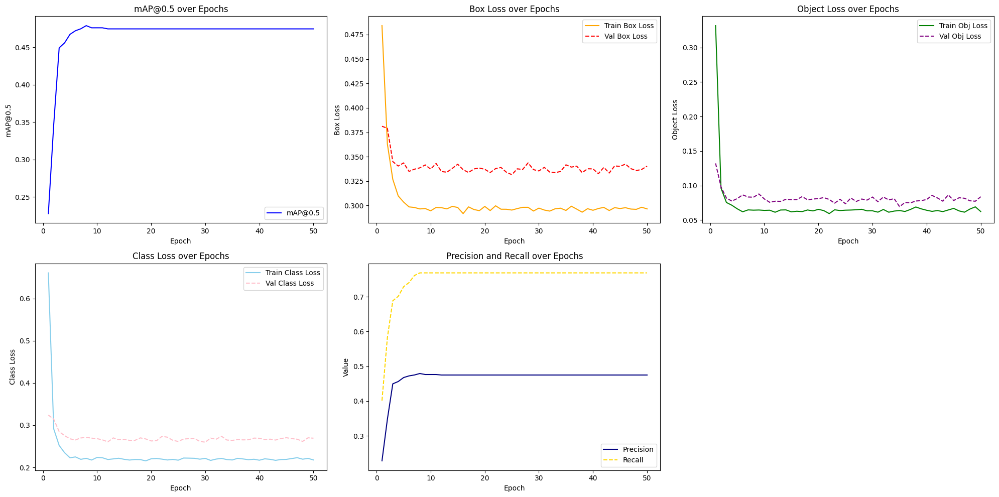

In [7]:
# Plotting results
import matplotlib.pyplot as plt
import os

results = pd.read_csv(results_path)

# Plotting
plt.figure(figsize=(20, 10))

# Subplot 1: mAP@0.5 over epochs
plt.subplot(2, 3, 1)
plt.plot(results['epoch'], results['metrics/mAP_0.5'], label='mAP@0.5', color='blue')
plt.xlabel('Epoch')
plt.ylabel('mAP@0.5')
plt.title('mAP@0.5 over Epochs')
plt.legend()

# Subplot 2: Training and Validation Box Loss
plt.subplot(2, 3, 2)
plt.plot(results['epoch'], results['train/box_loss'], label='Train Box Loss', color='orange')
plt.plot(results['epoch'], results['val/box_loss'], label='Val Box Loss', linestyle='--', color='red')
plt.xlabel('Epoch')
plt.ylabel('Box Loss')
plt.title('Box Loss over Epochs')
plt.legend()

# Subplot 3: Training and Validation Object Loss
plt.subplot(2, 3, 3)
plt.plot(results['epoch'], results['train/obj_loss'], label='Train Obj Loss', color='green')
plt.plot(results['epoch'], results['val/obj_loss'], label='Val Obj Loss', linestyle='--', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Object Loss')
plt.title('Object Loss over Epochs')
plt.legend()

# Subplot 4: Training and Validation Class Loss
plt.subplot(2, 3, 4)
plt.plot(results['epoch'], results['train/cls_loss'], label='Train Class Loss', color='skyblue')
plt.plot(results['epoch'], results['val/cls_loss'], label='Val Class Loss', linestyle='--', color='pink')
plt.xlabel('Epoch')
plt.ylabel('Class Loss')
plt.title('Class Loss over Epochs')
plt.legend()

# Subplot 5: Precision and Recall
plt.subplot(2, 3, 5)
plt.plot(results['epoch'], results['metrics/precision'], label='Precision', color='navy')
plt.plot(results['epoch'], results['metrics/recall'], label='Recall', linestyle='--', color='gold')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.title('Precision and Recall over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

## Step 3: Performing Inference Tests and Displaying Inference Results

In [8]:
import os
import glob

image_dir = '/kaggle/input/dataset-traffic/images/test'
image_paths = glob.glob(os.path.join(image_dir, '*.[jp][pn]g'))

for img_path in image_paths:
    !python scripts/detect_faster_rcnn.py --weights weights/best-faster-rcnn.pt --img_path "{img_path}" --yaml_class "/kaggle/working/FasterRCNN_YOLO_dataset/data.yaml"

/kaggle/input/dataset-traffic/images/test/Video1_35.jpg ['Car', 'Number Plate', 'Blur Number Plate', 'Two Wheeler', 'Auto', 'Bus', 'Truck'] 0.4 cuda weights/best-faster-rcnn.pt
/kaggle/working/FasterRCNN_YOLO_dataset/scripts/detect_faster_rcnn.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't 

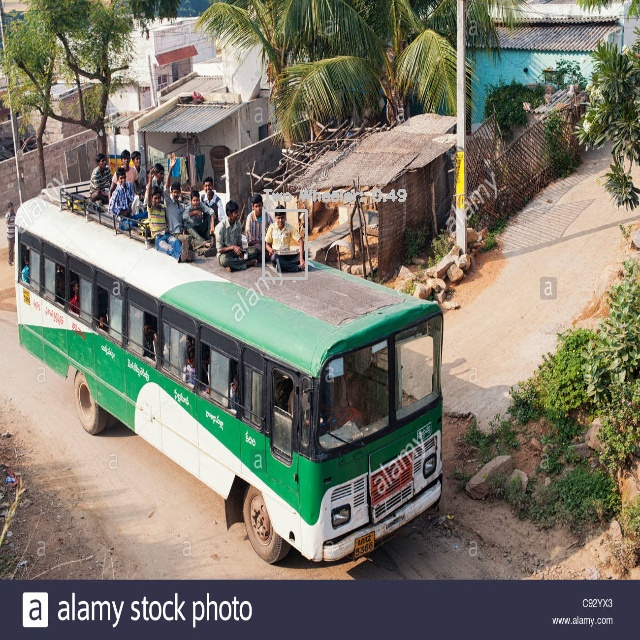

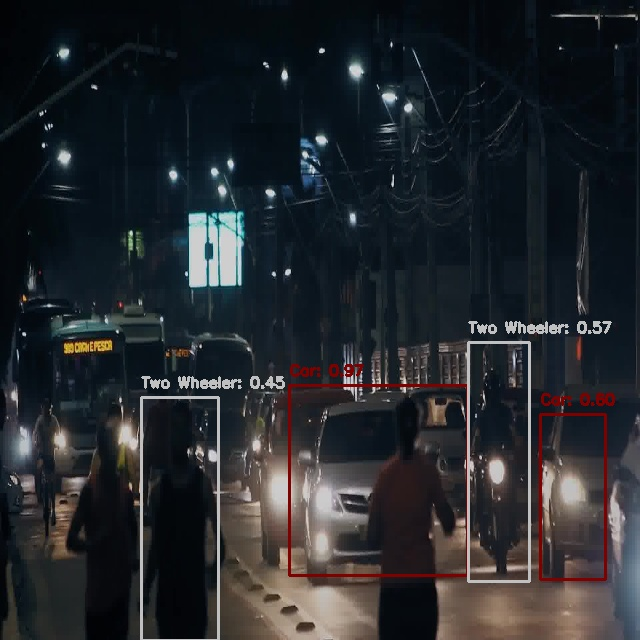

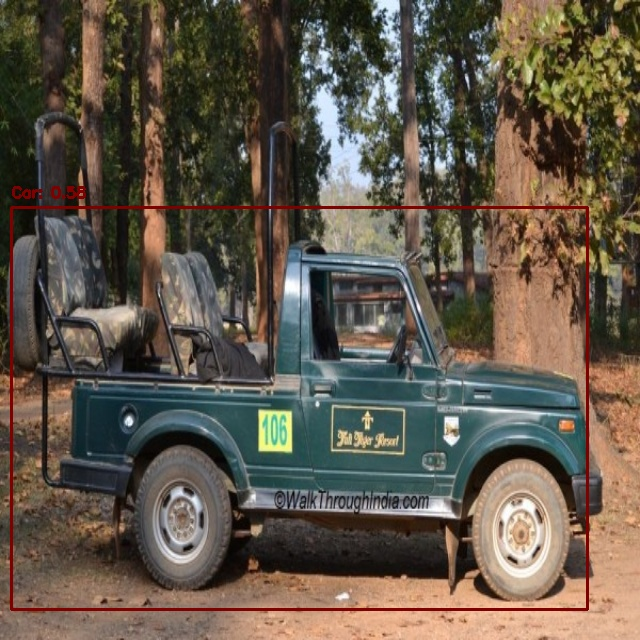

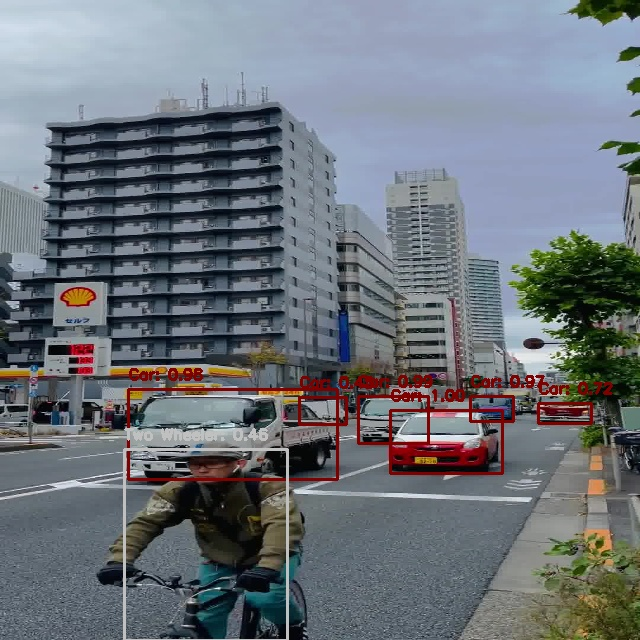

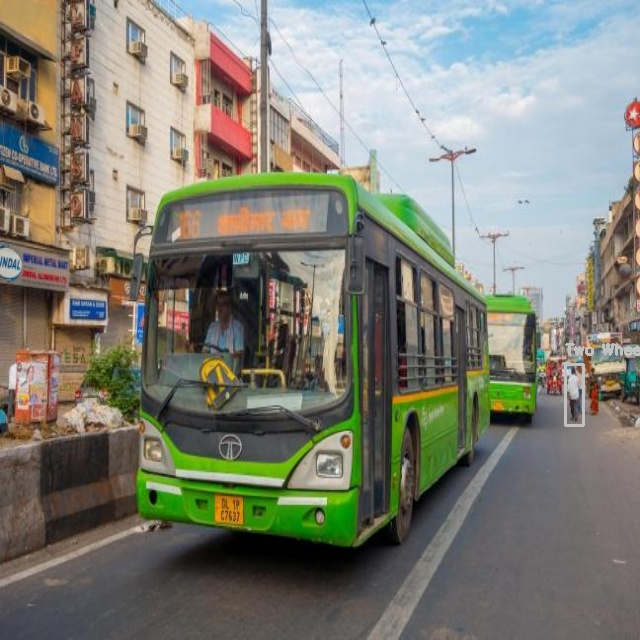

...

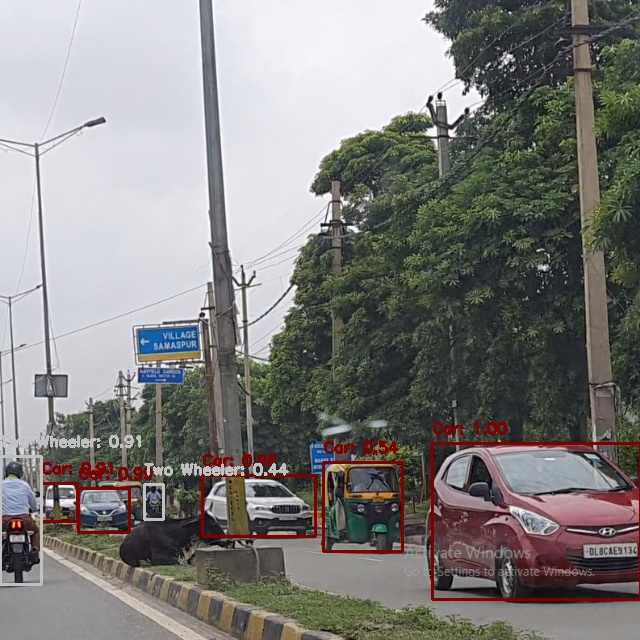

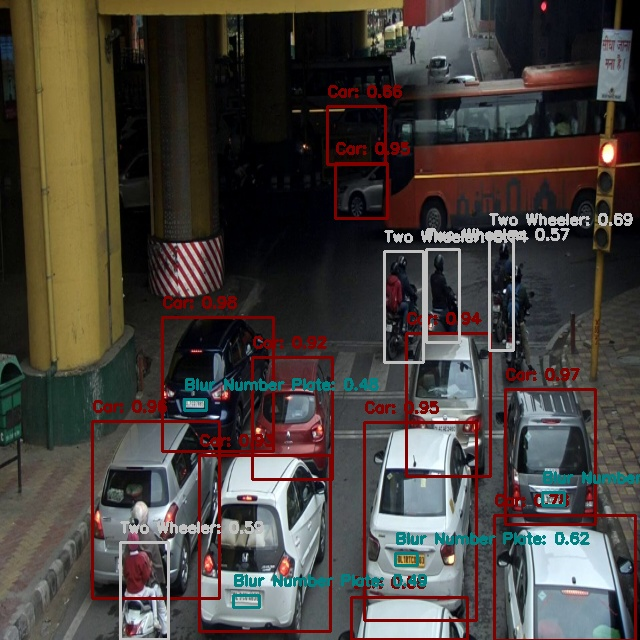

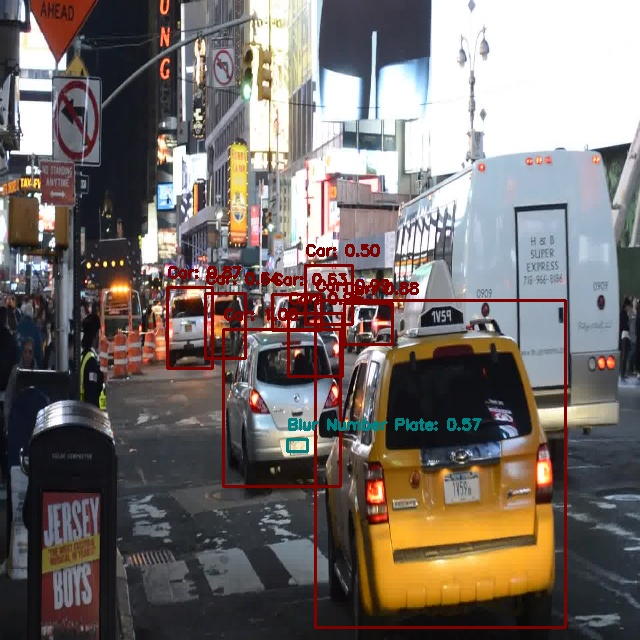

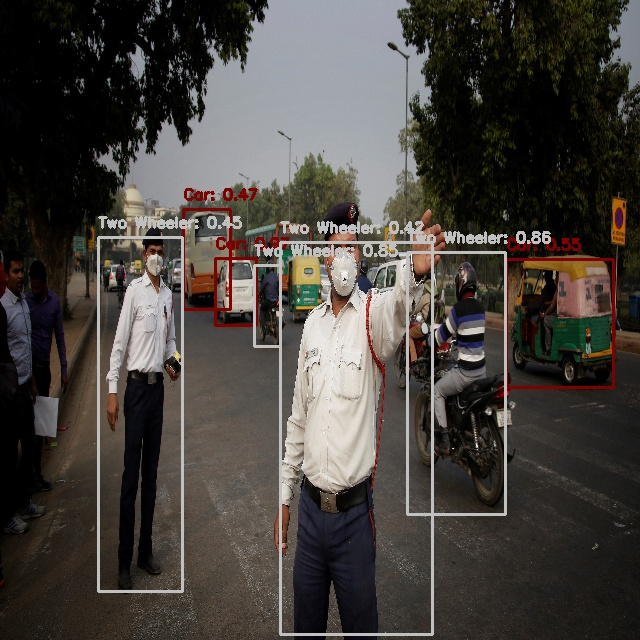

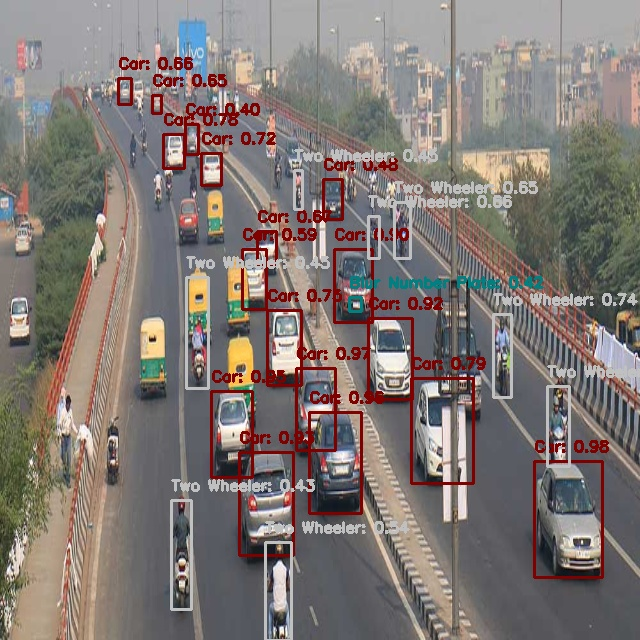

In [9]:
from IPython.display import Image, display

output_dir = '/kaggle/working/FasterRCNN_YOLO_dataset/output'
output_images = os.listdir(output_dir)

for image_name in output_images:
    if image_name.endswith('.jpg') or image_name.endswith('.png'):
        display(Image(filename=os.path.join(output_dir, image_name)))

## Step 4: Training the Model with augmented data

In [10]:
!python /kaggle/working/FasterRCNN_YOLO_dataset/scripts/train_faster_rcnn.py \
                    --data_dir "/kaggle/input/dataset-traffic" \
                    --batch_size 4 \
                    --epochs 50 \
                    --eval_every 5 \
                    --iter_every 50 \
                    --num_classes 7 \
                    --yaml "/kaggle/working/FasterRCNN_YOLO_dataset/data.yaml" \
                    --lr 0.01 \
                    --resize 640 \
                    --is_aug 1

Loading dataset...
Training started.
Device:  cuda
Number of classes:  7
Number of epochs:  50
Batch size:  4
Dataset length:  60
Evaluation every:  5
Epoch:[1/50]	Iter:[1/15]	cls_loss:2.3485	box_loss:1.0135	obj_loss:1.4731
Epoch:[1/50]	Iter:[15/15]	cls_loss:0.3600	box_loss:0.4294	obj_loss:0.2538
100%|█████████████████████████████████████████| 20/20 [00:00<00:00, 7475.15it/s]
[Evaluate epoch 1] 
Average cls_loss:0.7043	Average box_loss:0.5104	Average obj_loss:0.4511

Per-class AP/AR (IoU=0.5):
Class 0 (Car): AP@50=0.5313, AR@50=0.8699
Class 1 (Number Plate): AP@50=0.0000, AR@50=0.0000
Class 2 (Blur Number Plate): AP@50=0.0000, AR@50=0.0000
Class 3 (Two Wheeler): AP@50=0.3105, AR@50=0.5806
Class 4 (Auto): AP@50=0.0000, AR@50=0.0000
Class 5 (Bus): AP@50=0.0338, AR@50=0.2500
Class 6 (Truck): AP@50=0.1845, AR@50=0.3333

mAP@0.5 (all classes): 0.1514
>>> New best model found at epoch 1 with mAP@0.5 = 0.1514
Epoch:[2/50]	Iter:[1/15]	cls_loss:0.4194	box_loss:0.5977	obj_loss:0.2718
Epoch:[2/50

## Step 5: Reviewing Training Results (Augmented data)

In [11]:
import pandas as pd
results_path = "/kaggle/working/FasterRCNN_YOLO_dataset/logs/result.csv"
results = pd.read_csv(results_path)

In [12]:
results

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,val/box_loss,val/obj_loss,val/cls_loss,learning_rate
0,1,0.510400,0.451079,0.704254,0.151440,0.290557,0.151440,0.424138,0.218006,0.381234,1.000000e-02
1,2,0.405480,0.165581,0.347182,0.164250,0.331563,0.164250,0.407796,0.162680,0.363003,1.000000e-02
2,3,0.383043,0.143458,0.292014,0.283000,0.438453,0.283000,0.379678,0.156294,0.308578,1.000000e-03
3,4,0.363711,0.135237,0.285238,0.283308,0.459308,0.283308,0.379168,0.147952,0.309786,1.000000e-03
4,5,0.352719,0.126094,0.275998,0.258979,0.368667,0.258979,0.398341,0.138558,0.323142,1.000000e-03
5,6,0.375113,0.131559,0.290170,0.280956,0.413598,0.280956,0.371539,0.105267,0.301531,1.000000e-04
6,7,0.369100,0.128240,0.286276,0.277394,0.425080,0.277394,0.360938,0.136221,0.304118,1.000000e-04
7,8,0.365839,0.140648,0.287892,0.262496,0.389847,0.262496,0.381925,0.130157,0.306318,1.000000e-04
8,9,0.358954,0.153791,0.281533,0.288277,0.430132,0.288277,0.356271,0.143487,0.314405,1.000000e-05
9,10,0.344781,0.124584,0.277510,0.284156,0.416987,0.284156,0.362668,0.127953,0.296607,1.000000e-05


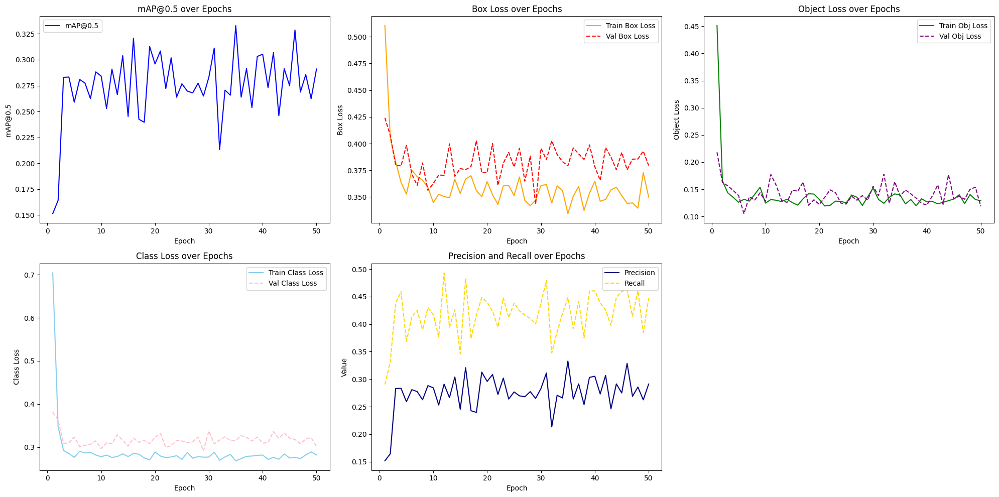

In [13]:
# Plotting results

results = pd.read_csv(results_path)

# Plotting
plt.figure(figsize=(20, 10))

# Subplot 1: mAP@0.5 over epochs
plt.subplot(2, 3, 1)
plt.plot(results['epoch'], results['metrics/mAP_0.5'], label='mAP@0.5', color='blue')
plt.xlabel('Epoch')
plt.ylabel('mAP@0.5')
plt.title('mAP@0.5 over Epochs')
plt.legend()

# Subplot 2: Training and Validation Box Loss
plt.subplot(2, 3, 2)
plt.plot(results['epoch'], results['train/box_loss'], label='Train Box Loss', color='orange')
plt.plot(results['epoch'], results['val/box_loss'], label='Val Box Loss', linestyle='--', color='red')
plt.xlabel('Epoch')
plt.ylabel('Box Loss')
plt.title('Box Loss over Epochs')
plt.legend()

# Subplot 3: Training and Validation Object Loss
plt.subplot(2, 3, 3)
plt.plot(results['epoch'], results['train/obj_loss'], label='Train Obj Loss', color='green')
plt.plot(results['epoch'], results['val/obj_loss'], label='Val Obj Loss', linestyle='--', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Object Loss')
plt.title('Object Loss over Epochs')
plt.legend()

# Subplot 4: Training and Validation Class Loss
plt.subplot(2, 3, 4)
plt.plot(results['epoch'], results['train/cls_loss'], label='Train Class Loss', color='skyblue')
plt.plot(results['epoch'], results['val/cls_loss'], label='Val Class Loss', linestyle='--', color='pink')
plt.xlabel('Epoch')
plt.ylabel('Class Loss')
plt.title('Class Loss over Epochs')
plt.legend()

# Subplot 5: Precision and Recall
plt.subplot(2, 3, 5)
plt.plot(results['epoch'], results['metrics/precision'], label='Precision', color='navy')
plt.plot(results['epoch'], results['metrics/recall'], label='Recall', linestyle='--', color='gold')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.title('Precision and Recall over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

## Step 6: Performing Inference Tests and Displaying Inference Results (Augmented data)

In [14]:
import os
import glob

image_dir = '/kaggle/input/dataset-traffic/images/test'
image_paths = glob.glob(os.path.join(image_dir, '*.[jp][pn]g'))

for img_path in image_paths:
    !python scripts/detect_faster_rcnn.py --weights weights/best-faster-rcnn.pt --img_path "{img_path}" --yaml_class "/kaggle/working/FasterRCNN_YOLO_dataset/data.yaml"

/kaggle/input/dataset-traffic/images/test/Video1_35.jpg ['Car', 'Number Plate', 'Blur Number Plate', 'Two Wheeler', 'Auto', 'Bus', 'Truck'] 0.4 cuda weights/best-faster-rcnn.pt
/kaggle/working/FasterRCNN_YOLO_dataset/scripts/detect_faster_rcnn.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't 

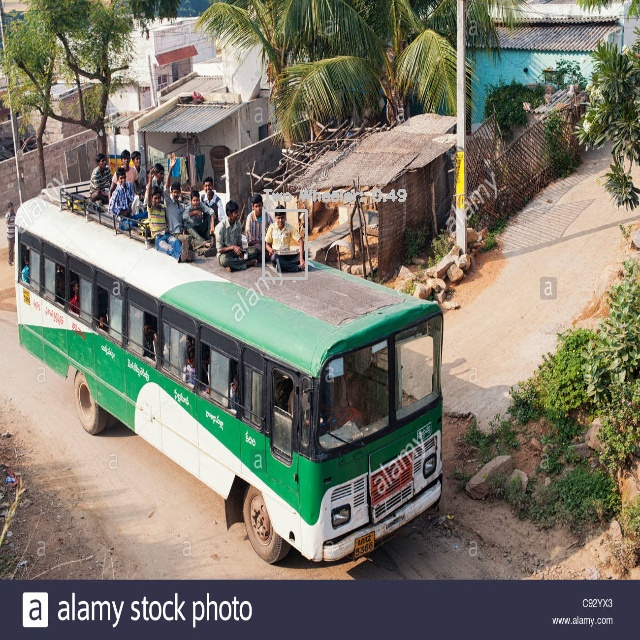

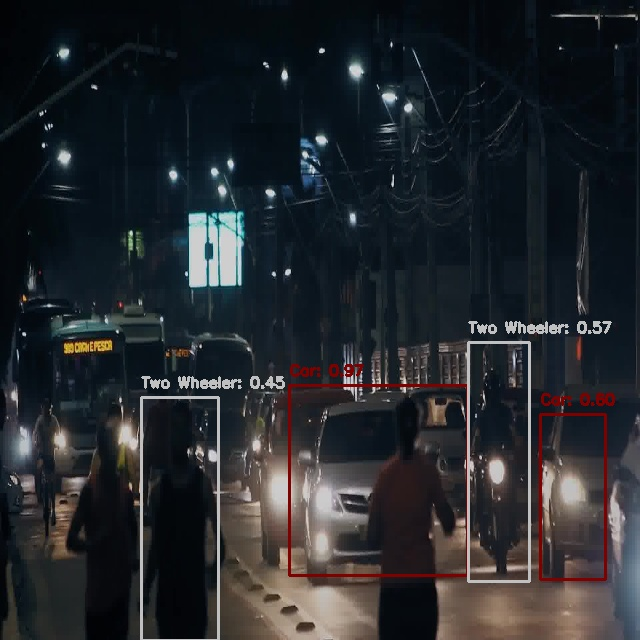

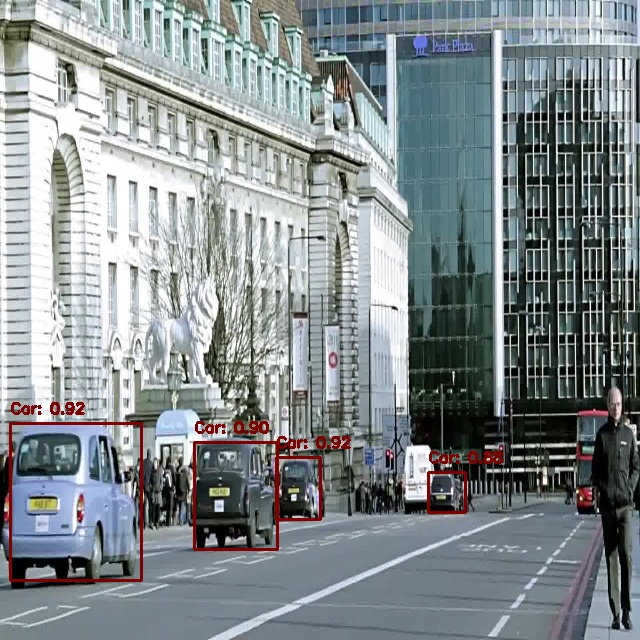

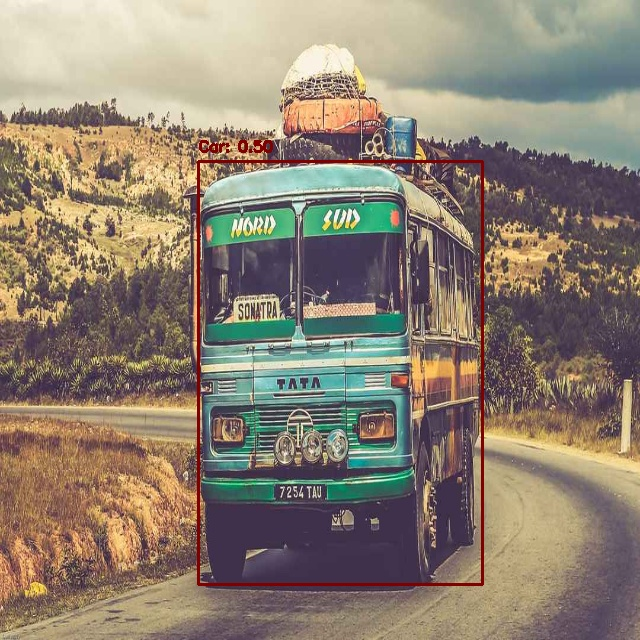

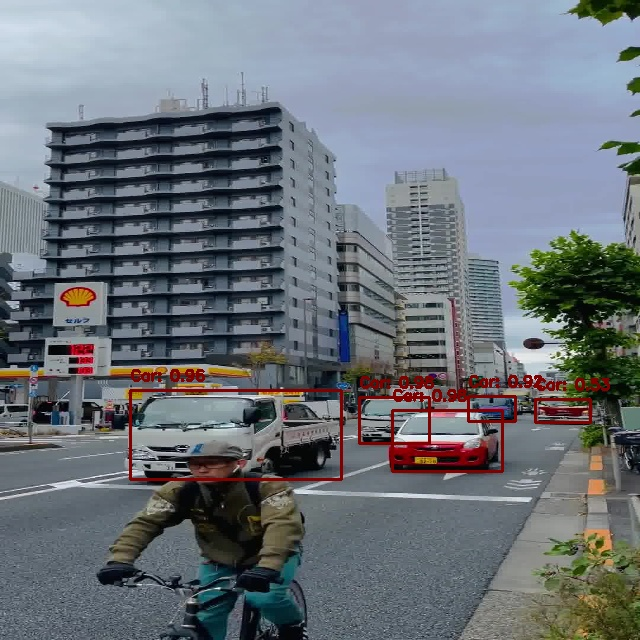

...

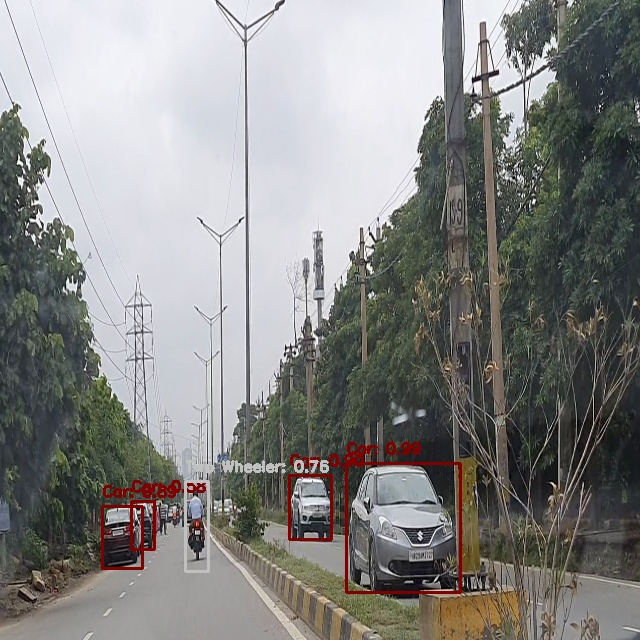

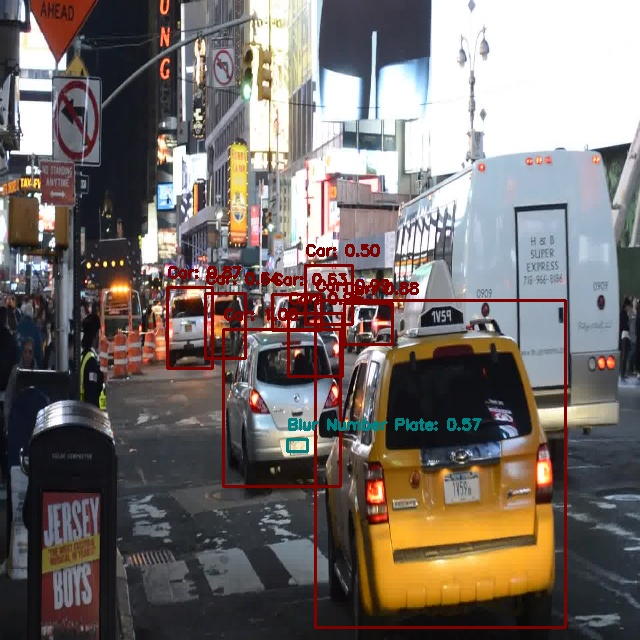

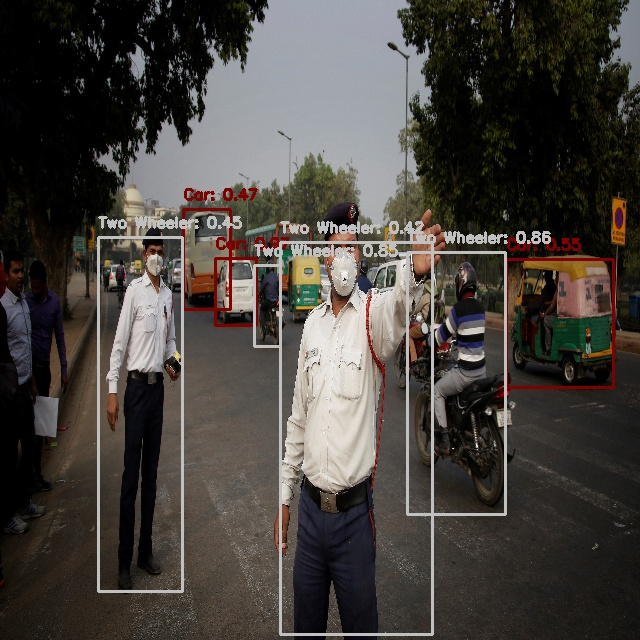

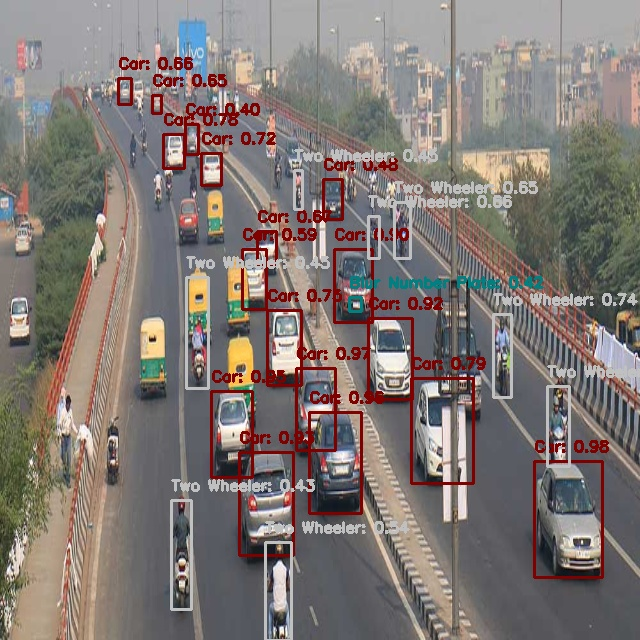

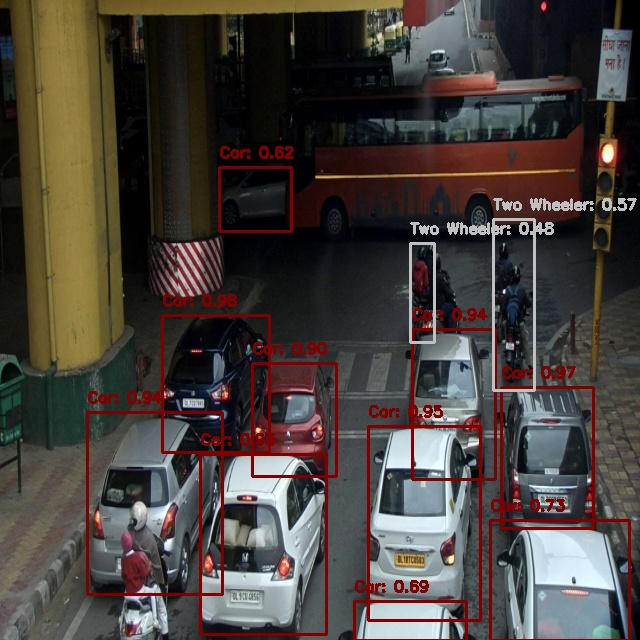

In [15]:
from IPython.display import Image, display

output_dir = '/kaggle/working/FasterRCNN_YOLO_dataset/output'
output_images = os.listdir(output_dir)

for image_name in output_images:
    if image_name.endswith('.jpg') or image_name.endswith('.png'):
        display(Image(filename=os.path.join(output_dir, image_name)))